In [1]:
# for loading mat file
from scipy.io import loadmat

# keras 
from keras.preprocessing.image import ImageDataGenerator
from keras.models import Model, Sequential
from keras.layers import Input, Convolution2D, MaxPooling2D, Flatten, Dense, Dropout, Permute, Activation
from keras.optimizers import Adam
from keras.utils import to_categorical
from keras import backend as K
K.set_image_data_format( 'channels_last' )

# processing image and face
import face_recognition
from PIL import Image
import numpy as np

# general packages
import os, math, copy
%matplotlib inline
import matplotlib.pyplot as plt

Using TensorFlow backend.


In [2]:
# Functions for creating VGG Face model
def convblock(cdim, nb, bits=3):
    L = []
    for k in range(1,bits+1):
        convname = 'conv'+str(nb)+'_'+str(k)
        L.append( Convolution2D(cdim, kernel_size=(3, 3), padding='same', activation='relu', name=convname) ) 
    L.append( MaxPooling2D((2, 2), strides=(2, 2)) )
    return L

def vgg_face_blank():

    mdl = Sequential()
    
    withDO = True

    # First layer is a dummy-permutation = Identity to specify input shape
    mdl.add( Permute((1,2,3), input_shape=(224,224,3)) ) # WARNING : 0 is the sample dim

    for l in convblock(64, 1, bits=2):
        mdl.add(l)

    for l in convblock(128, 2, bits=2):
        mdl.add(l)

    for l in convblock(256, 3, bits=3):
        mdl.add(l)

    for l in convblock(512, 4, bits=3):
        mdl.add(l)

    for l in convblock(512, 5, bits=3):
        mdl.add(l)

    mdl.add( Convolution2D(4096, kernel_size=(7, 7), activation='relu', name='fc6') ) # Keras 2
    if withDO:
        mdl.add( Dropout(0.5) )

    mdl.add( Convolution2D(4096, kernel_size=(1, 1), activation='relu', name='fc7') ) # Keras 2
    if withDO:
        mdl.add( Dropout(0.5) )

    mdl.add( Convolution2D(2622, kernel_size=(1, 1), activation='relu', name='fc8') ) # Keras 2
    mdl.add( Flatten() )
    mdl.add( Activation('softmax') )

    return mdl

# Original Face Model
vggFaceModel = vgg_face_blank()
vggFaceModel.summary()

_________________________________________________________________
Layer (type)                 Output Shape              Param #   
permute_1 (Permute)          (None, 224, 224, 3)       0         
_________________________________________________________________
conv1_1 (Conv2D)             (None, 224, 224, 64)      1792      
_________________________________________________________________
conv1_2 (Conv2D)             (None, 224, 224, 64)      36928     
_________________________________________________________________
max_pooling2d_1 (MaxPooling2 (None, 112, 112, 64)      0         
_________________________________________________________________
conv2_1 (Conv2D)             (None, 112, 112, 128)     73856     
_________________________________________________________________
conv2_2 (Conv2D)             (None, 112, 112, 128)     147584    
_________________________________________________________________
max_pooling2d_2 (MaxPooling2 (None, 56, 56, 128)       0         
__________

In [3]:
# Loading pre-trained weights from mat file 
data = loadmat('vgg_face.mat', matlab_compatible=False, struct_as_record=False)
net = data['net'][0,0]
l = net.layers
description = net.classes[0,0].description

# setting weights to model
def copy_mat_to_keras(kmodel):
    kerasnames = [lr.name for lr in kmodel.layers]
    prmt = (0,1,2,3) # INFO : for 'channels_last' setting of 'image_data_format'

    for i in range(l.shape[1]):
        matname = l[0,i][0,0].name[0]
        if matname in kerasnames:
            kindex = kerasnames.index(matname)
            #print matname
            l_weights = l[0,i][0,0].weights[0,0]
            l_bias = l[0,i][0,0].weights[0,1]
            f_l_weights = l_weights.transpose(prmt)
            assert (f_l_weights.shape == kmodel.layers[kindex].get_weights()[0].shape)
            assert (l_bias.shape[1] == 1)
            assert (l_bias[:,0].shape == kmodel.layers[kindex].get_weights()[1].shape)
            assert (len(kmodel.layers[kindex].get_weights()) == 2)
            kmodel.layers[kindex].set_weights([f_l_weights, l_bias[:,0]])
            
copy_mat_to_keras(vggFaceModel)

In [4]:
# Freeze every layer  
for layer in vggFaceModel.layers:
    layer.trainable = False

#Adding custom Layers 
x = vggFaceModel.get_layer("fc8").output
x = Flatten()(x)
x = Dense(1024, activation="relu")(x)
x = Dropout(0.5)(x)
x = Dense(512, activation="relu")(x)
x = Dense(128, activation="relu")(x)
predictions = Dense(2, activation="softmax")(x)

# creating the final model 
model_final = Model(input = vggFaceModel.input, output = predictions)
model_final.summary()

_________________________________________________________________
Layer (type)                 Output Shape              Param #   
permute_1_input (InputLayer) (None, 224, 224, 3)       0         
_________________________________________________________________
permute_1 (Permute)          (None, 224, 224, 3)       0         
_________________________________________________________________
conv1_1 (Conv2D)             (None, 224, 224, 64)      1792      
_________________________________________________________________
conv1_2 (Conv2D)             (None, 224, 224, 64)      36928     
_________________________________________________________________
max_pooling2d_1 (MaxPooling2 (None, 112, 112, 64)      0         
_________________________________________________________________
conv2_1 (Conv2D)             (None, 112, 112, 128)     73856     
_________________________________________________________________
conv2_2 (Conv2D)             (None, 112, 112, 128)     147584    
__________

/home/aravind/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:15: UserWarning: Update your `Model` call to the Keras 2 API: `Model(inputs=Tensor("pe..., outputs=Tensor("de...)`
  from ipykernel import kernelapp as app


In [5]:
# Create function to find face from image and centre.
def find_face(file, path = os.getcwd()):
    try:
        file = str(path) + '/' + str(file)
        image = face_recognition.load_image_file(file)
        face_locations = face_recognition.face_locations(image)
        top, right, bottom, left = face_locations[0]
        buffer = 10
        # You can access the actual face:
        face_image = image[top - buffer:bottom + buffer, left - buffer:right + buffer]
        pil_image = Image.fromarray(face_image)
        # resize to feed the model
        return pil_image.resize((224,224))
    except:
        print("Got Error:" + file[:-4])
        pass

In [6]:
# Function to display images
def show_images(images, cols = 1, titles = None):
    try:
        assert((titles is None)or (len(images) == len(titles)))
        n_images = len(images)
        if titles is None: titles = ['Image (%d)' % i for i in range(1,n_images + 1)]
        fig = plt.figure()
        for n, (image, title) in enumerate(zip(images, titles)):
            a = fig.add_subplot(cols, np.ceil(n_images/float(cols)), n + 1)
            if image.ndim == 2:
                plt.gray()
            plt.imshow(image)
            a.set_title(title)
        fig.set_size_inches(np.array(fig.get_size_inches()) * n_images)
        plt.show()
    except:
        print("Error: " + file)

In [7]:
# find nina face from folder of nina photos
ninaTrainImages = []
ninaTrainPath = os.getcwd() + "/train/nina"
files = os.listdir(ninaTrainPath)
print("No. of photos in the Nina Train folder: " + str(len(files)))
for file in files:
    ninaTemp = find_face(file, ninaTrainPath)
    if ninaTemp != None:
        ninaTrainImages.append(ninaTemp)
print("No. of photos able to find face in Nina Train Folder: " + str(len(ninaTrainImages)))

ninaValidImages = []
ninaValidPath = os.getcwd() + "/valid/nina"
files = os.listdir(ninaValidPath)
print("No. of photos in the Nina Valid folder: " + str(len(files)))
for file in files:
    ninaTemp = find_face(file, ninaValidPath)
    if ninaTemp != None:
        ninaValidImages.append(ninaTemp)
print("No. of photos able to find face in Nina Valid Folder: " + str(len(ninaValidImages)))

No. of photos in the Nina Train folder: 57
No. of photos able to find face in Nina Train Folder: 57
No. of photos in the Nina Valid folder: 146


/home/aravind/anaconda3/lib/python3.6/site-packages/PIL/Image.py:888: UserWarning: Palette images with Transparency   expressed in bytes should be converted to RGBA images
  'to RGBA images')


No. of photos able to find face in Nina Valid Folder: 146


In [8]:
# find victoria face from folder of victoria photos
victoriaTrainImages = []
victoriaTrainPath = os.getcwd() + "/train/justice"
files = os.listdir(victoriaTrainPath)
print("No. of photos in the Victoria train folder: " + str(len(files)))
for file in files:
    victoriaTemp = find_face(file, victoriaTrainPath)
    if victoriaTemp != None:
        victoriaTrainImages.append(victoriaTemp)
print("No. of photos able to find Victoria face in train folder: " + str(len(victoriaTrainImages)))


victoriaValidImages = []
victoriaValidPath = os.getcwd() + "/valid/justice"
files = os.listdir(victoriaValidPath)
print("No. of photos in the Victoria Valid folder: " + str(len(files)))
for file in files:
    victoriaTemp = find_face(file, victoriaValidPath)
    if victoriaTemp != None:
        victoriaValidImages.append(victoriaTemp)
print("No. of photos able to find Victoria face in Valid folder: " + str(len(victoriaValidImages)))

No. of photos in the Victoria train folder: 69
No. of photos able to find Victoria face in train folder: 69
No. of photos in the Victoria Valid folder: 92
No. of photos able to find Victoria face in Valid folder: 92


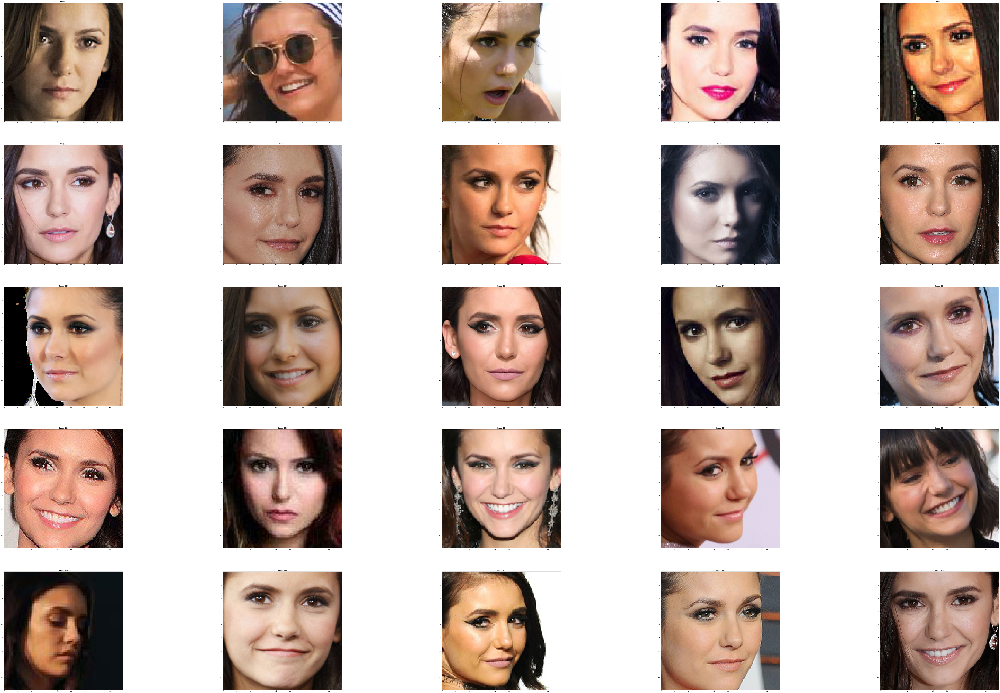

In [9]:
##### display the faces found for nina in train
show_images([np.asarray(i) for i in ninaTrainImages[:25]],cols = 5)

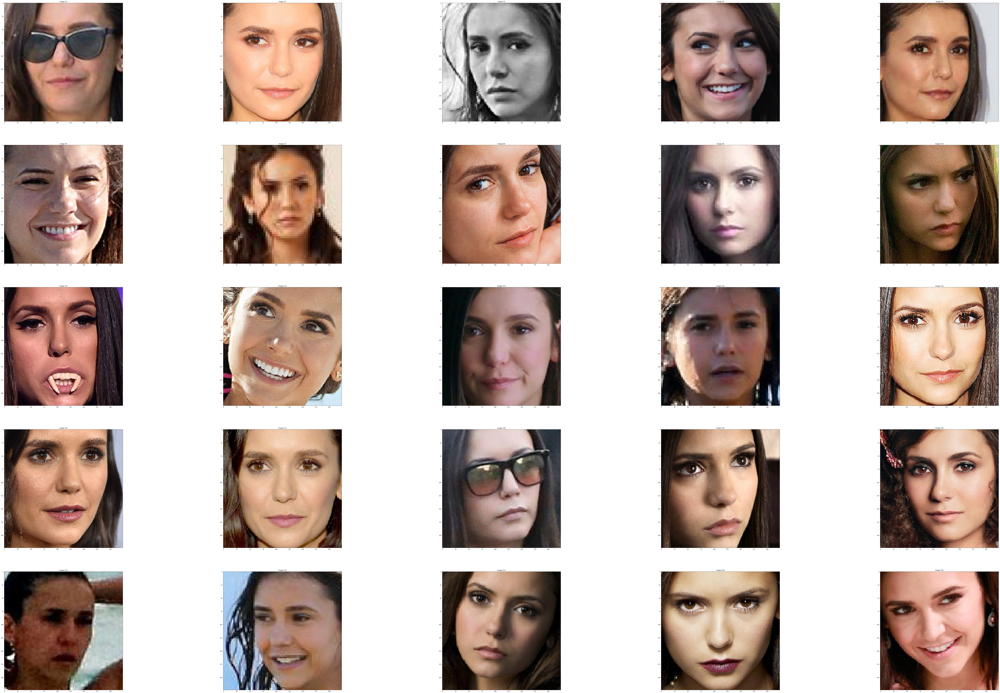

In [10]:
# display the faces found for nina in validation
show_images([np.asarray(i) for i in ninaValidImages[:25]], cols = 5)

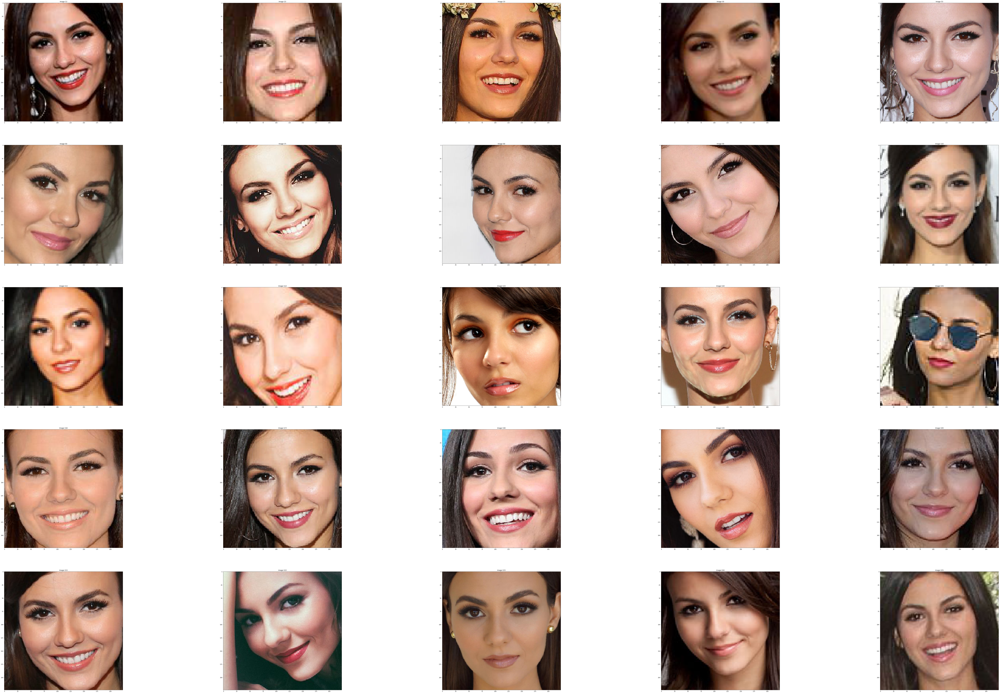

In [11]:
# display the faces found for justice in train
show_images([np.asarray(i) for i in victoriaTrainImages[:25]], cols = 5)

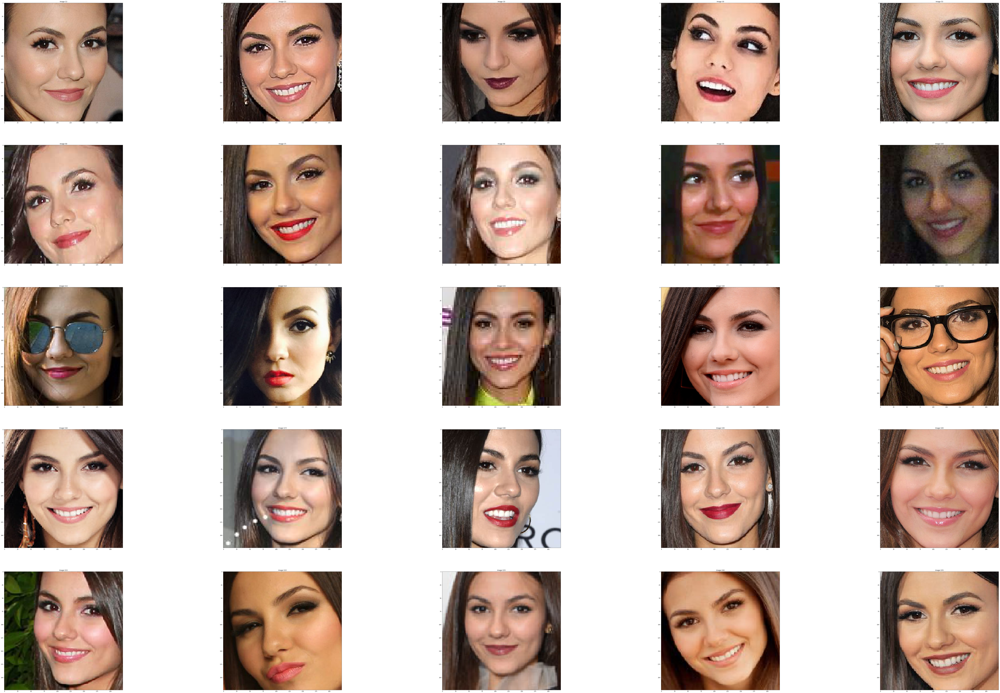

In [12]:
# display the faces found for justice in validation
show_images([np.asarray(i) for i in victoriaValidImages[:25]], cols = 5)

In [15]:
# Scale values between 0 and 1 so easier find minimum value
trainX = np.array([np.asarray(i) for i in [*ninaTrainImages , *victoriaTrainImages]], dtype = 'float') / 255.0
validX = np.array([np.asarray(i) for i in [*ninaValidImages , *victoriaValidImages]], dtype = 'float') / 255.0

# Convert labels to integer array
trainY = np.concatenate([[0] * len(ninaTrainImages) ,[1] * len(victoriaTrainImages)])
validY = np.concatenate([[0] * len(ninaValidImages) ,[1] * len(victoriaValidImages)])
 
# Convert integer to vector
trainY = to_categorical(trainY, num_classes  = 2)
validY = to_categorical(validY, num_classes  = 2)

# shuffle 
trainRand =  np.random.permutation(len(trainX))
validRand =  np.random.permutation(len(validX))

trainX = trainX[trainRand]
trainY = trainY[trainRand]

validX = validX[validRand]
validY = validY[validRand]

In [16]:
# Set parameters and compile the model 
epochs = 4
init_lr = 1e-3
BS = 32
opt = Adam(lr = init_lr, decay = init_lr/epochs)
model_final.compile(loss = "binary_crossentropy", optimizer = opt, metrics=["accuracy"])

In [17]:
# Data augumentation: do only horizontal flip
aug = ImageDataGenerator(horizontal_flip= True)
H = model_final.fit_generator(aug.flow(trainX, trainY, BS), validation_data= (validX, validY), steps_per_epoch= len(trainX) // BS, epochs= epochs, verbose  = 1)

Epoch 1/4
3/3 [==============================] - 270s 90s/step - loss: 0.6807 - acc: 0.5104 - val_loss: 0.6399 - val_acc: 0.5630
Epoch 2/4
3/3 [==============================] - 263s 88s/step - loss: 0.5411 - acc: 0.8487 - val_loss: 0.5037 - val_acc: 0.7983
Epoch 3/4
3/3 [==============================] - 262s 87s/step - loss: 0.3662 - acc: 0.8832 - val_loss: 0.2651 - val_acc: 0.9748
Epoch 4/4
3/3 [==============================] - 263s 88s/step - loss: 0.1919 - acc: 0.9675 - val_loss: 0.1248 - val_acc: 0.9790


In [18]:
# Get Images from test folder 
testImages = []
testPath = os.getcwd() + "/test"
files = os.listdir(testPath)
print("No. of photos in the test folder: " + str(len(files)))
for file in files:
    Temp = find_face(file, testPath)
    if Temp != None:
        testImages.append(Temp)
print("No. of photos able to find face in Test Folder: " + str(len(testImages)))

No. of photos in the test folder: 7
No. of photos able to find face in Test Folder: 7


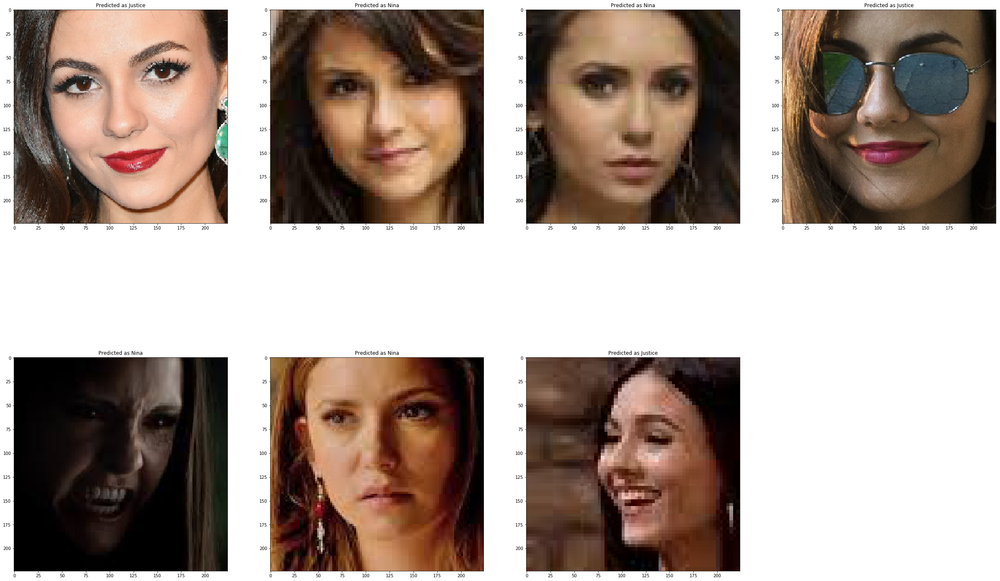

In [19]:
# Convert Images to arrays and predict the class
test_np = np.array([np.asarray(i) for i in testImages], dtype = 'float') / 255.0
test_pred = np.argmax(model_final.predict(test_np), axis = 1)

# Show Images with prediction class
label = ['Nina', 'Justice']
show_images([test_np[i] for i in range(test_np.shape[0])], titles=["Predicted as " + label[i] for i in test_pred], cols= 2)